<b> add your surname and name here!!!!!!</b>

##  SURNAME: Caprile NAME: Riccardo



In [1]:
%matplotlib inline
import sys
import numpy as np
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

# SIFT - a demo

The objective of this activity is to critically analyse the results you obtain by running the code and learn about the potential of SIFT descriptors for feature matching


## First time with OpenCV? 

So far we have used skimage. OpenCV has a wider range of Computational Vision pre-implemented functionalities.

Have a look at <a href="https://docs.opencv.org/master/d9/df8/tutorial_root.html" > online tutorials</a>

First, let us import the library

In [2]:
import cv2 as cv

## 1. SIFT computation and visualization

If you want to know something more click on the <a http="https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html"> SIFT OpenCV tutorial </a> 

We'll try out with an intensity image first


In [3]:
img = cv.imread('images/Rubik1.pgm')
gray= cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img_sift = None

sift = cv.SIFT_create()
kp = sift.detect(gray,None)
img_sift=cv.drawKeypoints(gray,kp,img_sift, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) #try and delete the flag
cv.imwrite('sift_keypoints.jpg',img_sift)


True

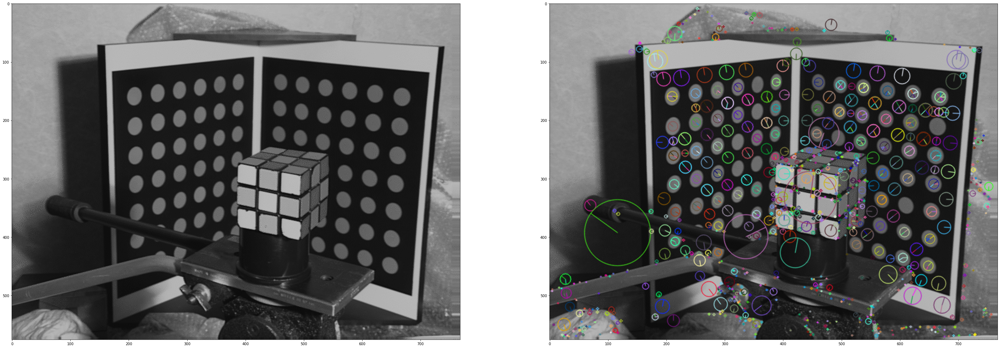

In [4]:
fig = plt.figure(figsize=(50, 100)) 
fig.add_subplot(1,2,1)
#plt.imshow(cv.cvtColor(gray, cv.COLOR_BGR2RGB))
plt.imshow(img)
fig.add_subplot(1,2,2)
#plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.imshow(img_sift)


<i>Can you comment the output you just obtain? Do the detected features make sense?</i>

<b>ADD COMMENTS HERE</b>

The only features that makes sense are the blobs behind the Rubik cube, because not all corner are detected
 
 


We try now with a color image. Notice that OpenCV uses BGR as a default color space, while the visualization functions don't (thus we need to convert BGR2RGB)

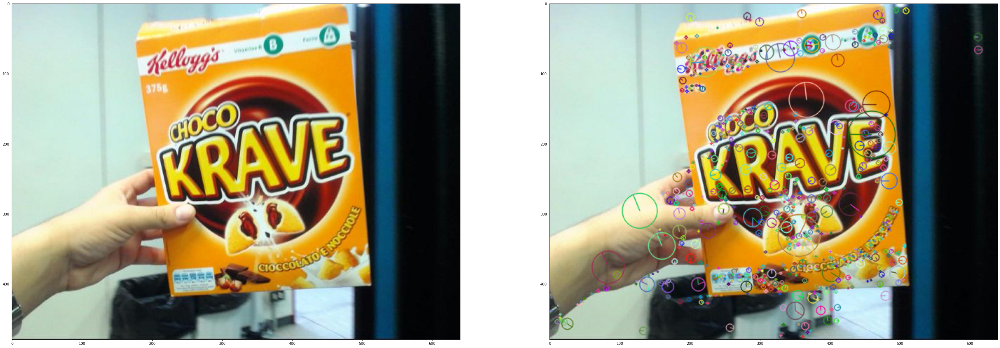

In [5]:
# ANOTHER EXAMPLE
img = cv.imread('imageset/BackgroundChange/09601.jpg')
gray= cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img_sift = None

sift = cv.SIFT_create()
kp = sift.detect(gray,None)
img_sift=cv.drawKeypoints(img,kp,img_sift, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) #try and delete the flag

fig = plt.figure(figsize=(50, 100)) 
fig.add_subplot(1,2,1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
#plt.imshow(img)
fig.add_subplot(1,2,2)
plt.imshow(cv.cvtColor(img_sift, cv.COLOR_BGR2RGB))
#plt.imshow(img_sift)



## 2. Image matching with SIFT features

We now compute matches between SIFT features from an image pair. In the example we notice a background, illumination and scale change

### 2.1 Detection first

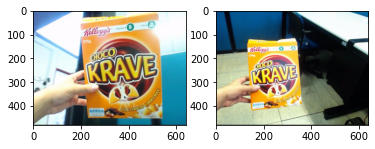

In [6]:
# Read and plot relevant images

img1 = cv.imread('imageset/BackgroundChange/11201.jpg')
img2 = cv.imread('imageset/BackgroundChange/18301.jpg')

# Parallel display of images
fig = plt.figure() 
fig.add_subplot(1,2,1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
fig.add_subplot(1,2,2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))

In [7]:
sift = cv.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)
img1_with_kp = None
img2_with_kp = None
img1_with_kp = cv.drawKeypoints(img1,kp1,img1_with_kp)
img2_with_kp = cv.drawKeypoints(img2,kp2,img2_with_kp)

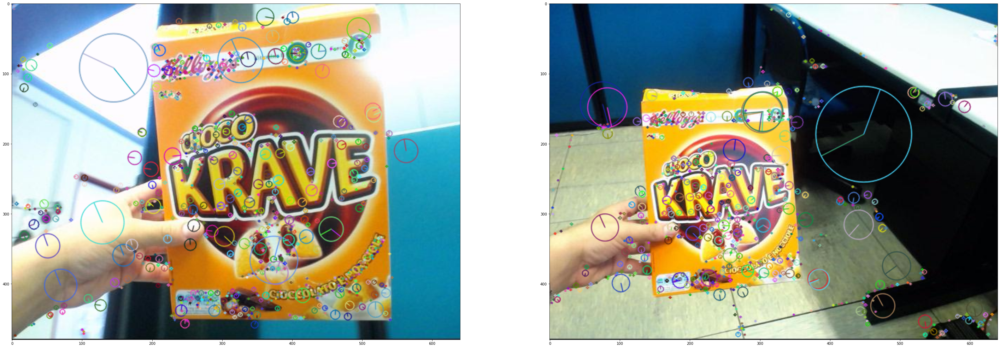

In [8]:
# Converting image1 from BGR to RGB (OpenCV design)
img1_with_kp=cv.drawKeypoints(img1,kp1,img1_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_with_kp=cv.drawKeypoints(img2,kp2,img2_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(50, 100))
plt.subplot(1,2,1)
plt.imshow(cv.cvtColor(img1_with_kp, cv.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.imshow(cv.cvtColor(img2_with_kp, cv.COLOR_BGR2RGB))


### 2.2 Matching
The  following feature matching will follow two steps:
1. Brute force matching
2. Lowe's filtering 

Brute force matching is a simple: take the featue description of each feature in one image and calculate it's distance from every feature in the other image. Lowe filtering is a thresholding technique to eliminate matches with high distances. 

If you have time, you may check other parameters of BFMatcher. You may try them and see how the results change!

In [9]:
# BFMatcher with default params
bf = cv.BFMatcher()

In [10]:
# Testing the top two best matches to increase matching accuracy
matches = bf.knnMatch(des1,des2, k=2)

In [11]:
# Store all the good matches as per Lowe's ratio test
good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append([m])

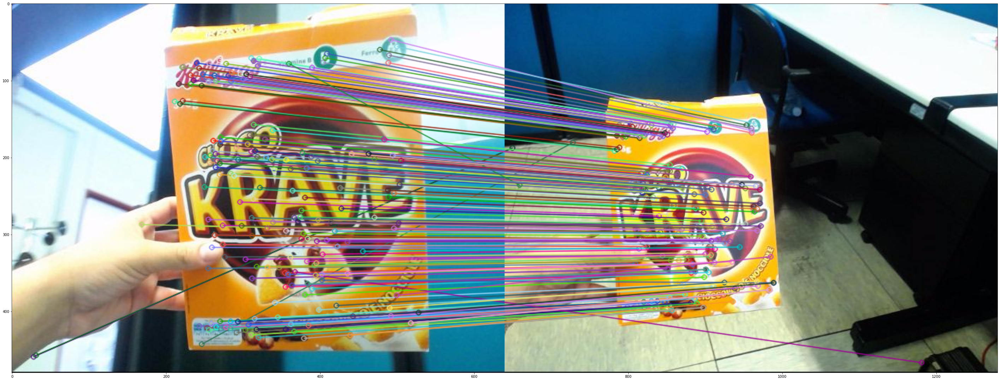

In [12]:
img3 = None
img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,img3,flags=2)
plt.figure(figsize=(50, 100))
plt.imshow(cv.cvtColor(img3, cv.COLOR_BGR2RGB))

Try the above with other images pairs from the sets provided. In particular, try image pairs from  
1. Imageset/2DMovement 
2. Imageset/ColorChanges
3. Imageset/Random

Observe the success and failure of the two methods against different types of variations. 

<b> ADD YOUR COMMENTS HERE </b>

I've cleared all the outputs , otherwise the zip file would have been too large for the upload in aulaweb

In the 2D movements seems to work perfectly , but we've got some problem when when compare imaages taken 
from 3D movement and Occlusion folders.

In 3D movement example we can see the major difficulties on matching features. SIFT was only able to match few features , whereas in Occlusion example  matches are clearly more

In [ ]:
# Read and plot relevant images

img1 = cv.imread('imageset/2DMovements/09401.jpg')
img2 = cv.imread('imageset/2DMovements/10201.jpg')

# Parallel display of images
fig = plt.figure() 
fig.add_subplot(1,2,1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
fig.add_subplot(1,2,2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))

In [14]:
sift = cv.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)
img1_with_kp = None
img2_with_kp = None
img1_with_kp = cv.drawKeypoints(img1,kp1,img1_with_kp)
img2_with_kp = cv.drawKeypoints(img2,kp2,img2_with_kp)

In [ ]:
# Converting image1 from BGR to RGB (OpenCV design)
img1_with_kp=cv.drawKeypoints(img1,kp1,img1_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_with_kp=cv.drawKeypoints(img2,kp2,img2_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(50, 100))
plt.subplot(1,2,1)
plt.imshow(cv.cvtColor(img1_with_kp, cv.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.imshow(cv.cvtColor(img2_with_kp, cv.COLOR_BGR2RGB))

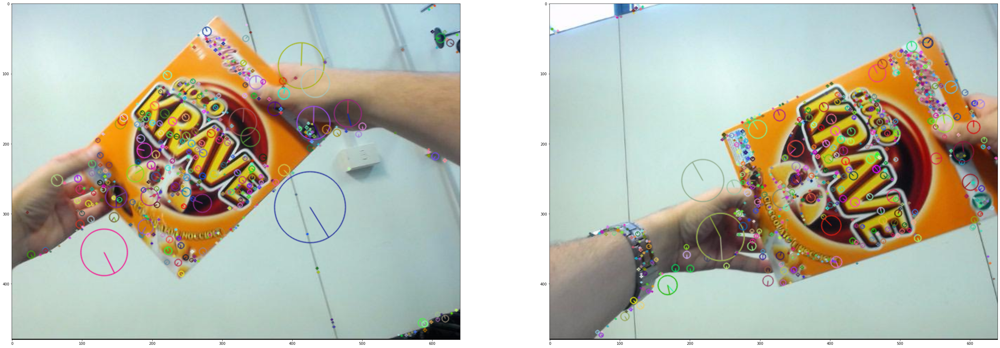

In [16]:
# Converting image1 from BGR to RGB (OpenCV design)
img1_with_kp=cv.drawKeypoints(img1,kp1,img1_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_with_kp=cv.drawKeypoints(img2,kp2,img2_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(50, 100))
plt.subplot(1,2,1)
plt.imshow(cv.cvtColor(img1_with_kp, cv.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.imshow(cv.cvtColor(img2_with_kp, cv.COLOR_BGR2RGB))

In [17]:
# BFMatcher with default params
bf = cv.BFMatcher()

In [18]:
# Testing the top two best matches to increase matching accuracy
matches = bf.knnMatch(des1,des2, k=2)

In [19]:
# Store all the good matches as per Lowe's ratio test
good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append([m])

In [ ]:
img3 = None
img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,img3,flags=2)
plt.figure(figsize=(50, 100))
plt.imshow(cv.cvtColor(img3, cv.COLOR_BGR2RGB))

In [ ]:
# Read and plot relevant images

img1 = cv.imread('imageset/Occlusion/31101.jpg')
img2 = cv.imread('imageset/Occlusion/48901.jpg')

# Parallel display of images
fig = plt.figure() 
fig.add_subplot(1,2,1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
fig.add_subplot(1,2,2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))

In [ ]:
sift = cv.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)
img1_with_kp = None
img2_with_kp = None
img1_with_kp = cv.drawKeypoints(img1,kp1,img1_with_kp)
img2_with_kp = cv.drawKeypoints(img2,kp2,img2_with_kp)

In [ ]:
# Converting image1 from BGR to RGB (OpenCV design)
img1_with_kp=cv.drawKeypoints(img1,kp1,img1_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_with_kp=cv.drawKeypoints(img2,kp2,img2_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(50, 100))
plt.subplot(1,2,1)
plt.imshow(cv.cvtColor(img1_with_kp, cv.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.imshow(cv.cvtColor(img2_with_kp, cv.COLOR_BGR2RGB))

In [ ]:
# BFMatcher with default params
bf = cv.BFMatcher()

In [ ]:
# Testing the top two best matches to increase matching accuracy
matches = bf.knnMatch(des1,des2, k=2)

In [ ]:
# Store all the good matches as per Lowe's ratio test
good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append([m])

In [ ]:
img3 = None
img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,img3,flags=2)
plt.figure(figsize=(50, 100))
plt.imshow(cv.cvtColor(img3, cv.COLOR_BGR2RGB))

In [ ]:
# Read and plot relevant images

img1 = cv.imread('imageset/3Dmovements/18301.jpg')
img2 = cv.imread('imageset/3Dmovements/08601.jpg')

# Parallel display of images
fig = plt.figure() 
fig.add_subplot(1,2,1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
fig.add_subplot(1,2,2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))

In [ ]:
sift = cv.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)
img1_with_kp = None
img2_with_kp = None
img1_with_kp = cv.drawKeypoints(img1,kp1,img1_with_kp)
img2_with_kp = cv.drawKeypoints(img2,kp2,img2_with_kp)

In [ ]:
# Converting image1 from BGR to RGB (OpenCV design)
img1_with_kp=cv.drawKeypoints(img1,kp1,img1_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_with_kp=cv.drawKeypoints(img2,kp2,img2_with_kp,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(50, 100))
plt.subplot(1,2,1)
plt.imshow(cv.cvtColor(img1_with_kp, cv.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.imshow(cv.cvtColor(img2_with_kp, cv.COLOR_BGR2RGB))

In [ ]:
# BFMatcher with default params
bf = cv.BFMatcher()

In [ ]:
# Testing the top two best matches to increase matching accuracy
matches = bf.knnMatch(des1,des2, k=2)

In [ ]:
# Store all the good matches as per Lowe's ratio test
good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append([m])

In [ ]:
img3 = None
img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,img3,flags=2)
plt.figure(figsize=(50, 100))
plt.imshow(cv.cvtColor(img3, cv.COLOR_BGR2RGB))